In [1]:
import os
import json
import random
import pickle
import cv2
import numpy as np
import pandas as pd
import skimage as sk
import functions as ff
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from tqdm import tqdm
from PIL import Image, ImageDraw, ImageChops
from pathlib import Path
from sklearn import svm
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,confusion_matrix,ConfusionMatrixDisplay

In [2]:
def load_image(image,transform):
  new_img, _ = ff.pad_image(image)
  new_img = transform(new_img)[:3].unsqueeze(0)
  return new_img

def compute_embeddings(image_paths,device,transform,transformer):
  all_embeddings = {}
  with torch.no_grad():
    for _, img in enumerate(tqdm(image_paths,desc="Processing files")):
      embeddings = transformer(load_image(img,transform).to(device))
      all_embeddings[img] = np.array(embeddings[0].cpu().numpy()).reshape(1, -1).tolist()

  with open("all_embeddings.json", "w") as f:
      f.write(json.dumps(all_embeddings))
  
  return all_embeddings

def test_model(images,img_lbl_dict,embeddings,classes,model):
  images_embeddings = ff.get_values(images,embeddings)
  embeddings_list = np.array(list(images_embeddings)).reshape(-1,384)
  with torch.no_grad():
    predictions = model.predict(embeddings_list)
    labels = ff.get_values(images,img_lbl_dict)
    res = ff.calculate_metrics(labels,predictions)
    print(f"Accuracy: {res[0]}, Precision: {res[1]}, Recall: {res[2]}, F1 score: {res[3]}")
    ff.create_cm(labels,predictions,classes)


In [3]:
furkan_images_dir = "./dataset/Furkan_Pan/images"
gamze_images_dir = "./dataset/Gamze_Pan/images"
furkan_excel_path = "./dataset/Furkan_Excel.xlsx"
gamze_excel_path = "./dataset/Gamze_Excel.xlsx"
total_excel_path = "./dataset/Total_Excel.xlsx"
furkan_json_dir = "./dataset/Furkan_Pan/JSON/outputs"
gamze_json_dir = "./dataset/Gamze_Pan/JSON/outputs"
masks_dir = "./masks"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
transform = T.Compose([T.ToTensor(),T.Normalize([0.5], [0.5])])
classes = ["Hatasız","Hatalı"]

In [4]:
labels_file = pd.read_excel(total_excel_path,header=None,keep_default_na=False)
total_images_paths = ff.merge_directories(furkan_images_dir,gamze_images_dir,sort=True,fullPath=True)
total_json_paths = ff.merge_directories(furkan_json_dir,gamze_json_dir,isImage=False,sort=True,fullPath=True)
total_masks_paths = ff.create_list(masks_dir,sort=True,fullPath=True)
img_lbl_dict = ff.create_img_label_dict(total_images_paths,labels_file,column_num=1)
mask_img_dict = ff.create_dict(total_masks_paths,total_images_paths)
mask_lbl_dict = ff.create_img_label_dict(total_masks_paths,labels_file,column_num=1)
img_json_dict = ff.create_dict(total_images_paths,total_json_paths)
pd.Series({
    "Labels file length =" : len(labels_file),
    "Images list length =" : len(total_images_paths),
    "Masks list length =" : len(total_masks_paths),
    "Total json list length =" : len(total_json_paths),
    "Json dictionary length =" : len(img_json_dict),
    "Label dictionary  length =" : len(img_lbl_dict),
    "Label dictionary  length =" : len(mask_lbl_dict)
}).to_frame().style.hide(axis='columns')

Labels file length =,1497
Images list length =,1497
Masks list length =,1497
Total json list length =,1497
Json dictionary length =,1497
Label dictionary length =,1497


In [5]:
masks_paths = random.sample(total_masks_paths,1400)         ## Get 1400 sample randomly for training.
print(f"For train: {len(masks_paths)}, Total: {len(total_masks_paths)}")

For train: 1400, Total: 1497


In [6]:
#print(f"Repeated Elements: {findRepeatedElements(images_paths)}")
test_masks = ff.getNotFoundElements(total_masks_paths,masks_paths)
print(f"Test images: {len(test_masks)}")

Test images: 97


In [7]:
ff.display_images_labels(masks_paths,mask_lbl_dict)

,Image,Label
0,./masks\640.png,0
1,./masks\3136.png,1
2,./masks\2361.png,1
3,./masks\623.png,1
4,./masks\2444.png,1
...,...,...
1395,./masks\112.png,1
1396,./masks\775.png,0
1397,./masks\513.png,0
1398,./masks\918.png,1


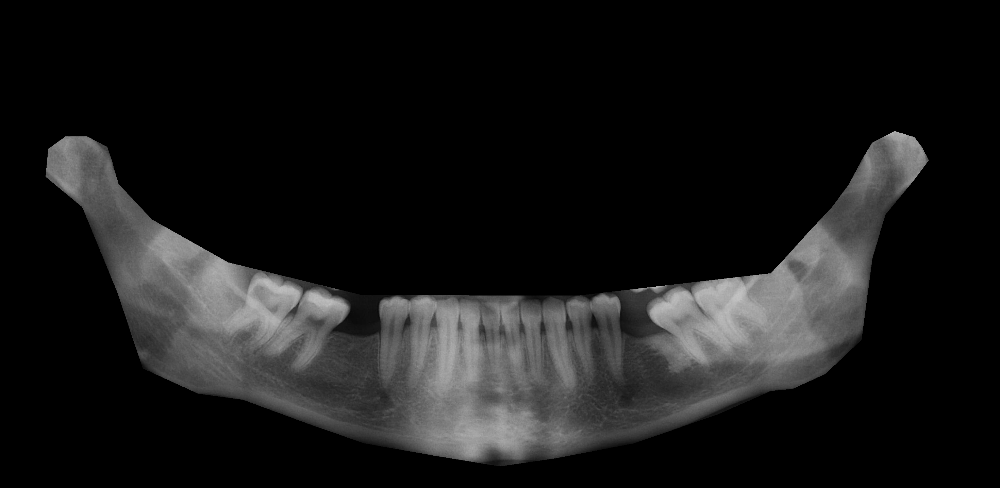

In [8]:
sample = random.choice(total_masks_paths)
img_s = Image.open(sample).convert('RGB')
img_s

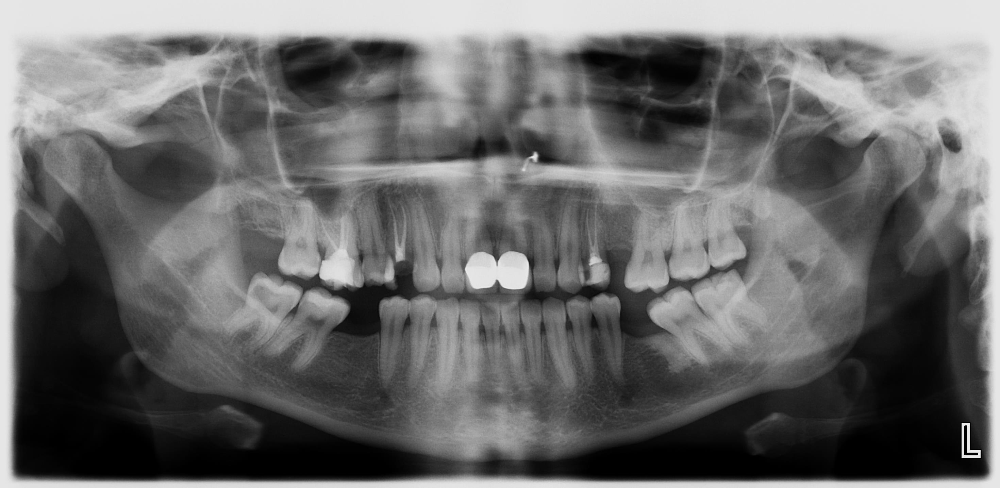

In [9]:
sample_img_path = mask_img_dict[sample]
sample_img = Image.open(sample_img_path).convert('RGB')
sample_img

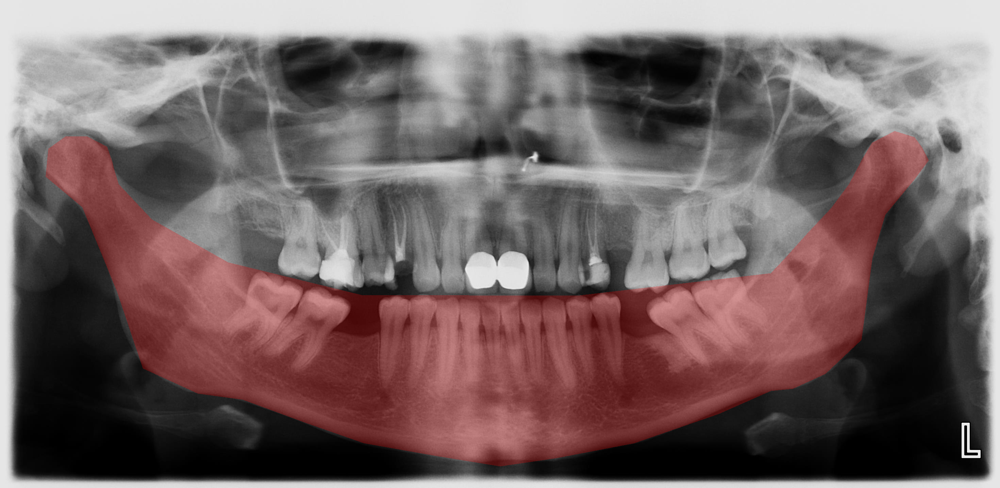

In [10]:
sample_json_path = img_json_dict[sample_img_path]
masked_image = ff.draw_overlay_mask_on_org_image(sample_img_path,sample_json_path)
masked_image

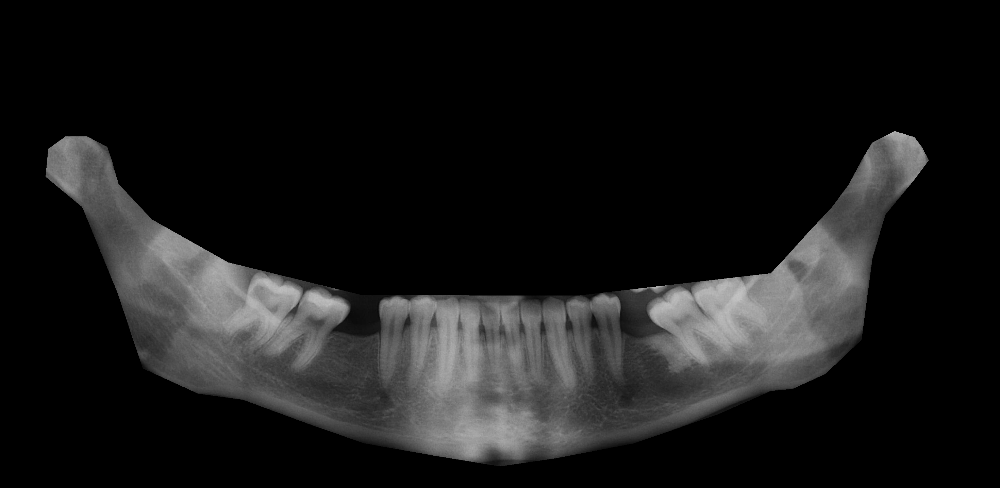

In [11]:
ff.extract_mask(sample_img_path,sample_json_path)

In [47]:
##total_masks = ff.extract_all_masks(total_images_paths,img_json_dict)

100%|██████████| 1497/1497 [08:25<00:00,  2.96it/s]


## Hangi resize işlemi kullanayım diye bu iki scripti çalıştırıyorum.


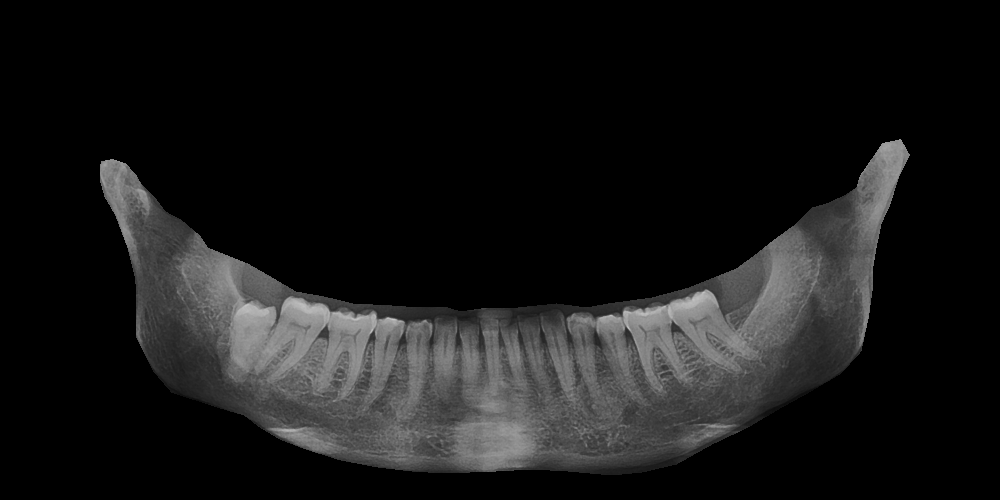

In [20]:
path = random.choice(total_masks_paths)
sample = Image.open(path).convert('RGB')
sample

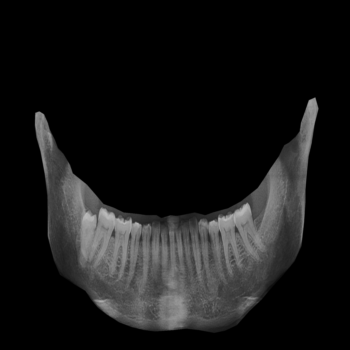

In [21]:
transformed = T.Resize((350,350))(sample)
transformed

(350, 350)


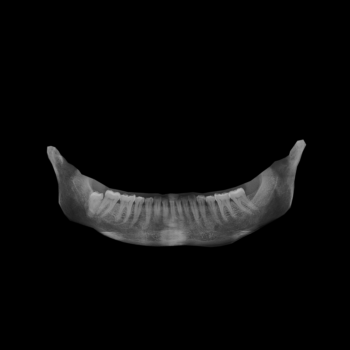

In [22]:
img, info = ff.pad_image(path)
print(info)
img

## Training

In [23]:
dinov2_vits14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dinov2_vits14 = dinov2_vits14.to(device)

Using cache found in C:\Users\esamh/.cache\torch\hub\facebookresearch_dinov2_main
C:\Users\esamh/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
C:\Users\esamh/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
C:\Users\esamh/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


In [24]:
clf = svm.SVC(probability=True,gamma='scale')               ## Initialize classifier
K = 5                                                       ## Number of folds
kf = KFold(n_splits=K)                                      ## Define K-Fold method for cross validation

In [25]:
total_embeddings = compute_embeddings(total_masks_paths,device,transform,dinov2_vits14)

Processing files: 100%|██████████| 1497/1497 [05:02<00:00,  4.95it/s]


Fold 1/5
Accuracy: 0.6464285714285715, Precision: 0.672514619883041, Recall: 0.7278481012658228, F1 Score: 0.6990881458966566
Fold 2/5
Accuracy: 0.6642857142857143, Precision: 0.6756756756756757, Recall: 0.7861635220125787, F1 Score: 0.7267441860465117
Fold 3/5
Accuracy: 0.5928571428571429, Precision: 0.5480225988700564, Recall: 0.7404580152671756, F1 Score: 0.6298701298701299
Fold 4/5
Accuracy: 0.5928571428571429, Precision: 0.5737704918032787, Recall: 0.7446808510638298, F1 Score: 0.6481481481481481
Fold 5/5
Accuracy: 0.625, Precision: 0.6573033707865169, Recall: 0.7267080745341615, F1 Score: 0.6902654867256638


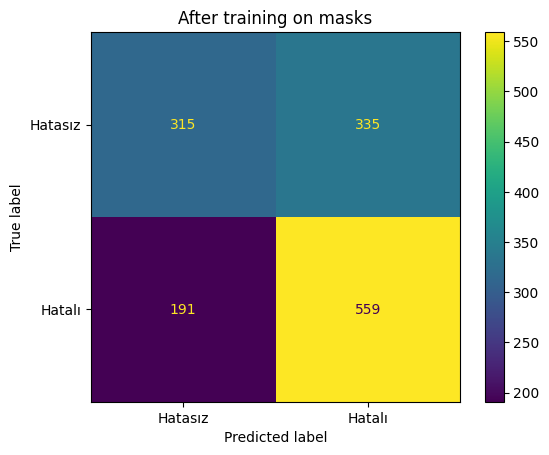

In [26]:
## Train loop
metrics = []
predicted = []
actual_lbls = []
model = None
for i, (train_index, test_index) in enumerate(kf.split(masks_paths)):
  print(f"Fold {i+1}/{K}")
  ## Get select images for train/test folds.
  x_train = ff.get_selected_indexes(train_index,masks_paths)
  x_test  = ff.get_selected_indexes(test_index,masks_paths)

  train_emb = ff.get_values(x_train,total_embeddings)
  test_emb = ff.get_values(x_test,total_embeddings)

  train_emb_list = np.array(list(train_emb)).reshape(-1,384)
  test_emb_list = np.array(list(test_emb)).reshape(-1,384)
  ## Get corresponding labels.
  y_train = ff.get_values(x_train,mask_lbl_dict)
  y_test = ff.get_values(x_test,mask_lbl_dict)

  model = clf.fit(train_emb_list,y_train)
  predictions = model.predict(test_emb_list)
  
  predicted.extend(predictions)
  actual_lbls.extend(y_test)
  res = ff.calculate_metrics(y_test,predictions)
  print(f"Accuracy: {res[0]}, Precision: {res[1]}, Recall: {res[2]}, F1 Score: {res[3]}")
  metrics.append(res)

ff.create_cm(actual_lbls,predicted,classes,title="After training on masks")          ## Draw confusion matrix

In [27]:
## Save the model
with open('./dinv2_vit14_with_svm_for_masks_binary_clf.pth', 'wb') as model_file:
    pickle.dump(model, model_file)

## Training sonucunda modelin performansı gösterme

In [28]:
avg_acc, avg_precision, avg_recall, avg_f1= 0, 0, 0, 0
acc = []
for i in range(K):
    avg_acc += metrics[i][0]
    acc.append(metrics[i][0])
    avg_precision += metrics[i][1]
    avg_recall += metrics[i][2]
    avg_f1 += metrics[i][3]

avg_acc = 100*avg_acc/K
avg_precision = 100*avg_precision/K
avg_recall = 100*avg_recall/K
avg_f1 = 100*avg_f1/K

pd.Series({
    "Average Accuracy" : avg_acc,
    "Average Precision": avg_precision,
    "Average Recall" : avg_recall,
    "Average F1 Score" : avg_f1
}).to_frame().style.hide(axis='columns')


Average Accuracy,62.428571
Average Precision,62.545735
Average Recall,74.517171
Average F1 Score,67.882322


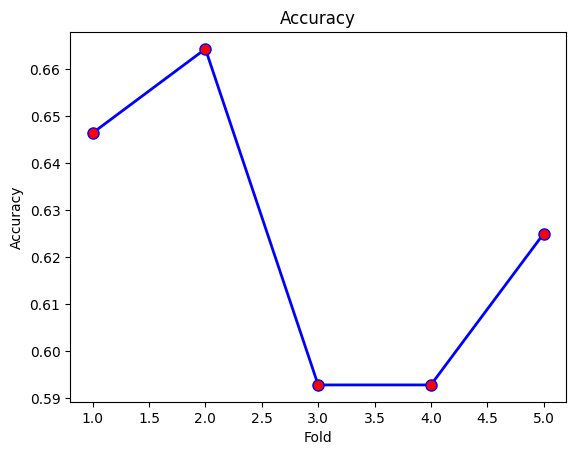

In [29]:
plt.plot(range(1,K+1),acc,color="blue",linewidth = 2,marker='o', markerfacecolor='red', markersize=8)
plt.title("Accuracy")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.show()

## Sadece 97 resim üzerinde test yapar.
Bu resimler training aşamasına dahil edilmedi.

Accuracy: 0.5979381443298969, Precision: 0.6491228070175439, Recall: 0.6607142857142857, F1 score: 0.6548672566371682


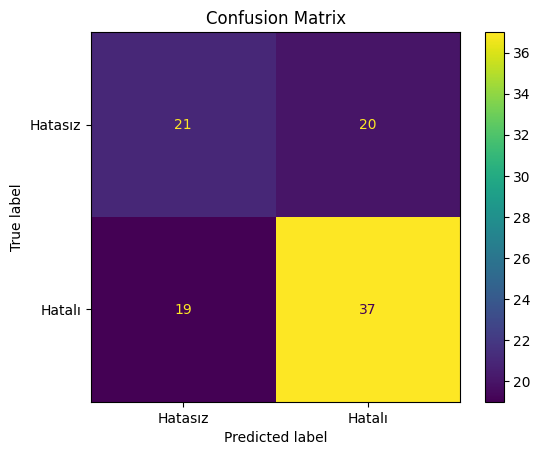

In [31]:
test_model(test_masks,mask_lbl_dict,total_embeddings,classes,model)

## Bütün resimler için test

Accuracy: 0.6586506346025384, Precision: 0.6619099890230515, Recall: 0.7481389578163772, F1 score: 0.7023878858474082


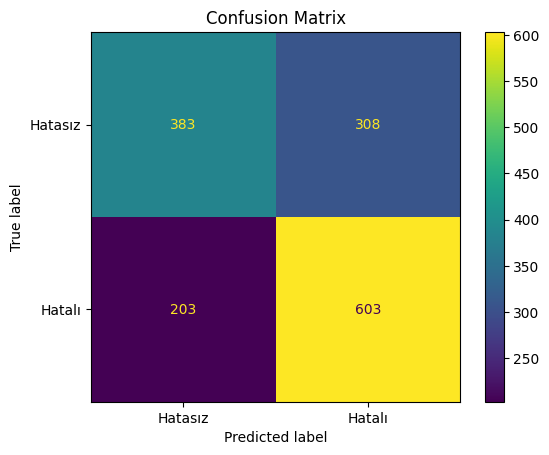

In [33]:
test_model(total_masks_paths,mask_lbl_dict,total_embeddings,classes,model)